In [2]:
import numpy
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
# import csv file
df = pd.read_csv(r'C:\Users\hp\Data Science\archive\Hackathon_Ideal_Data.csv', encoding= 'unicode_escape')

In [20]:
df.shape

(14260, 10)

In [21]:
df.head(100)

,MONTH,STORECODE,QTY,VALUE,GRP,SGRP,SSGRP,CMP,MBRD,BRD
0,M1,P1,25,83,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE
1,M1,P1,6,22,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR
2,M1,P1,4,15,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE
3,M1,P1,15,60,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,L'OREAL INDIA,GARNIER,FRUCTIS
4,M1,P2,0,0,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,CLINIC PLUS,CLINIC PLUS
...,...,...,...,...,...,...,...,...,...,...
95,M3,P9,44,151,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE
96,M3,P9,30,102,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR
97,M3,P9,82,1795,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,SUNSILK,SUNSILK SHINY SMOOTH & TNGL FR
98,M2,P1,9,31,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14260 entries, 0 to 14259
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   MONTH      14260 non-null  object
 1   STORECODE  14260 non-null  object
 2   QTY        14260 non-null  int64 
 3   VALUE      14260 non-null  int64 
 4   GRP        14260 non-null  object
 5   SGRP       14260 non-null  object
 6   SSGRP      14260 non-null  object
 7   CMP        14260 non-null  object
 8   MBRD       14260 non-null  object
 9   BRD        14260 non-null  object
dtypes: int64(2), object(8)
memory usage: 1.1+ MB


In [23]:
pd.isnull(df)

,MONTH,STORECODE,QTY,VALUE,GRP,SGRP,SSGRP,CMP,MBRD,BRD
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
14255,False,False,False,False,False,False,False,False,False,False
14256,False,False,False,False,False,False,False,False,False,False
14257,False,False,False,False,False,False,False,False,False,False
14258,False,False,False,False,False,False,False,False,False,False


In [24]:
pd.isnull(df).sum()

MONTH        0
STORECODE    0
QTY          0
VALUE        0
GRP          0
SGRP         0
SSGRP        0
CMP          0
MBRD         0
BRD          0
dtype: int64

In [25]:
df.columns


Index(['MONTH', 'STORECODE', 'QTY', 'VALUE', 'GRP', 'SGRP', 'SSGRP', 'CMP',
       'MBRD', 'BRD'],
      dtype='object')

In [26]:
# describe() method returns description of the data in the DataFrame (i.e. count, mean, std, etc)
df.describe()

,QTY,VALUE
count,14260.000000,14260.000000
mean,16.354488,294.455330
std,34.365583,760.129558
min,0.000000,0.000000
25%,1.000000,10.000000
50%,4.000000,99.000000
75%,16.000000,283.000000
max,641.000000,24185.000000


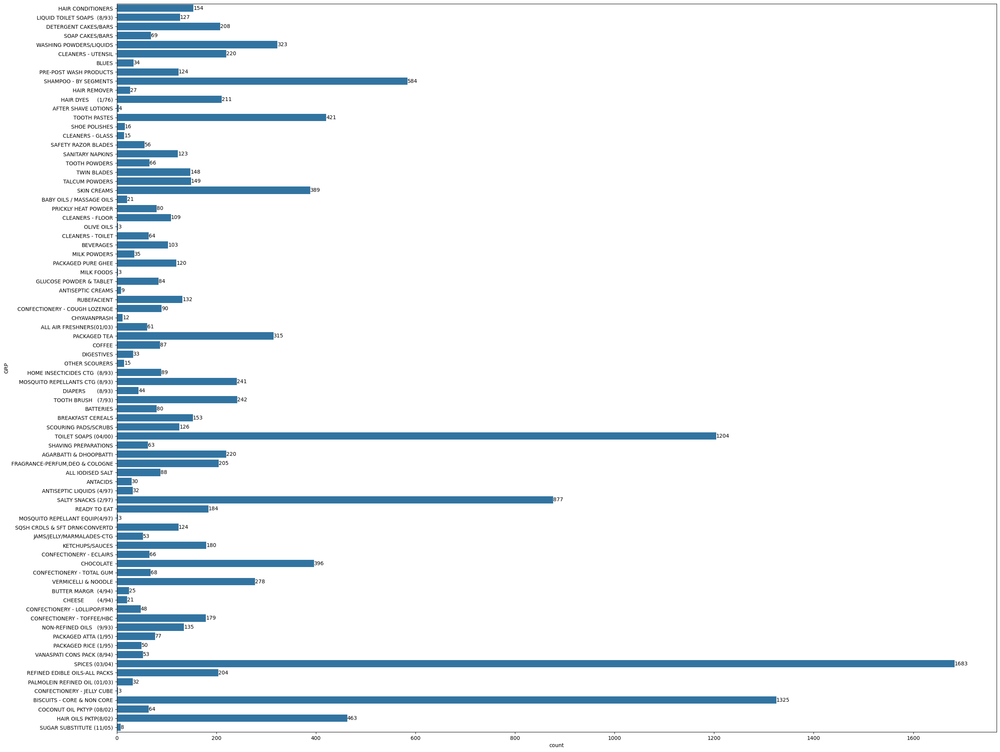

In [27]:
plt.figure(figsize=(30, 25))  # Adjust width and height as needed
ax = sns.countplot(y='GRP', data=df)
for bars in ax.containers:
    ax.bar_label(bars)

<Axes: xlabel='MONTH', ylabel='QTY'>

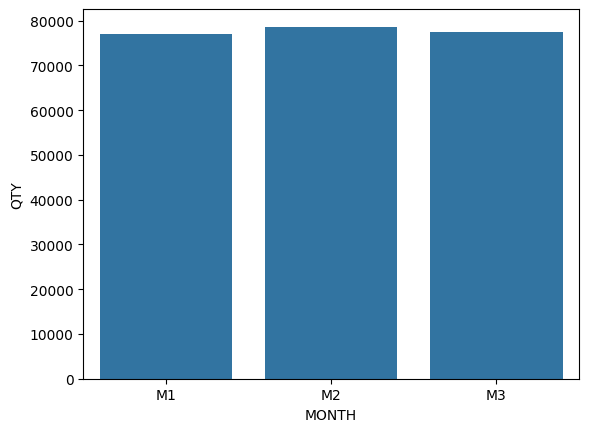

In [28]:
# Define the custom order of months
custom_order = ['M1', 'M2', 'M3']

# Convert the 'MONTH' column to categorical type with the custom order
df['MONTH'] = pd.Categorical(df['MONTH'], categories=custom_order, ordered=True)

# Group by 'MONTH' and sum the 'QTY' values
sales_gen = df.groupby('MONTH', as_index=False, observed=False)['QTY'].sum().sort_values(by='QTY', ascending=False)

# Plot the bar chart
sns.barplot(x='MONTH', y='QTY', data=sales_gen)

<Axes: xlabel='QTY', ylabel='GRP'>

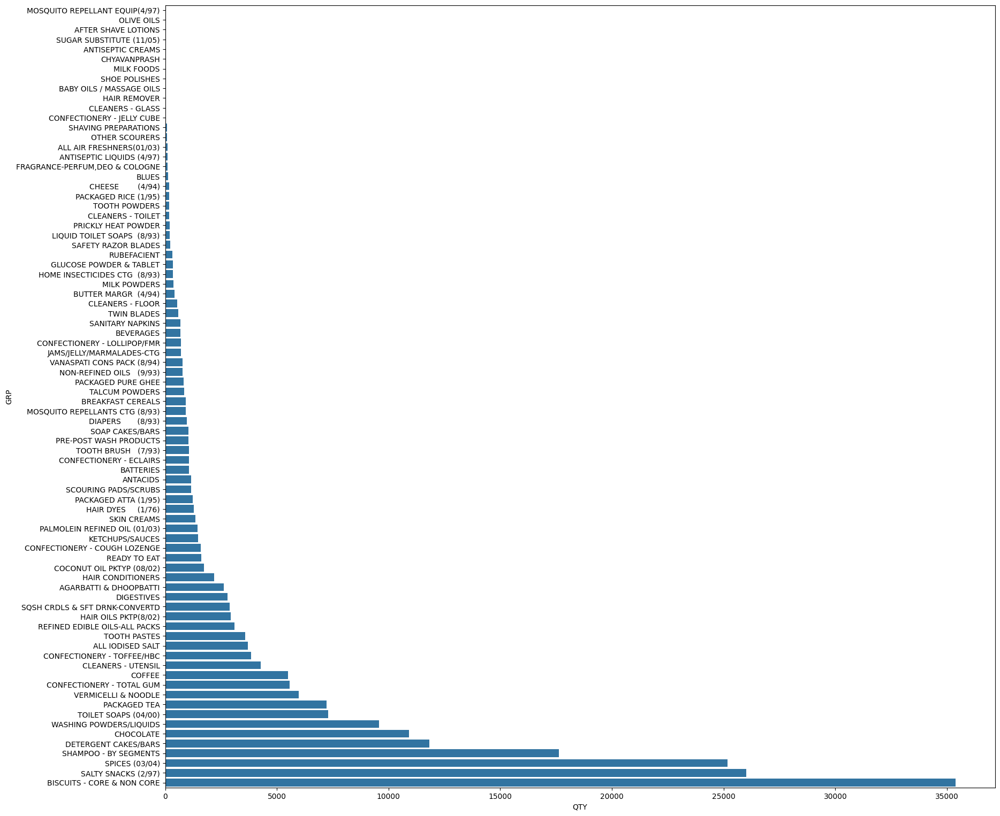

In [29]:
plt.figure(figsize=(20, 19))
a=df.groupby(['GRP'],as_index=False)['QTY'].sum().sort_values(by='QTY',ascending=True)
sns.barplot(x='QTY',y='GRP',data=a)

<Axes: xlabel='QTY', ylabel='SGRP'>

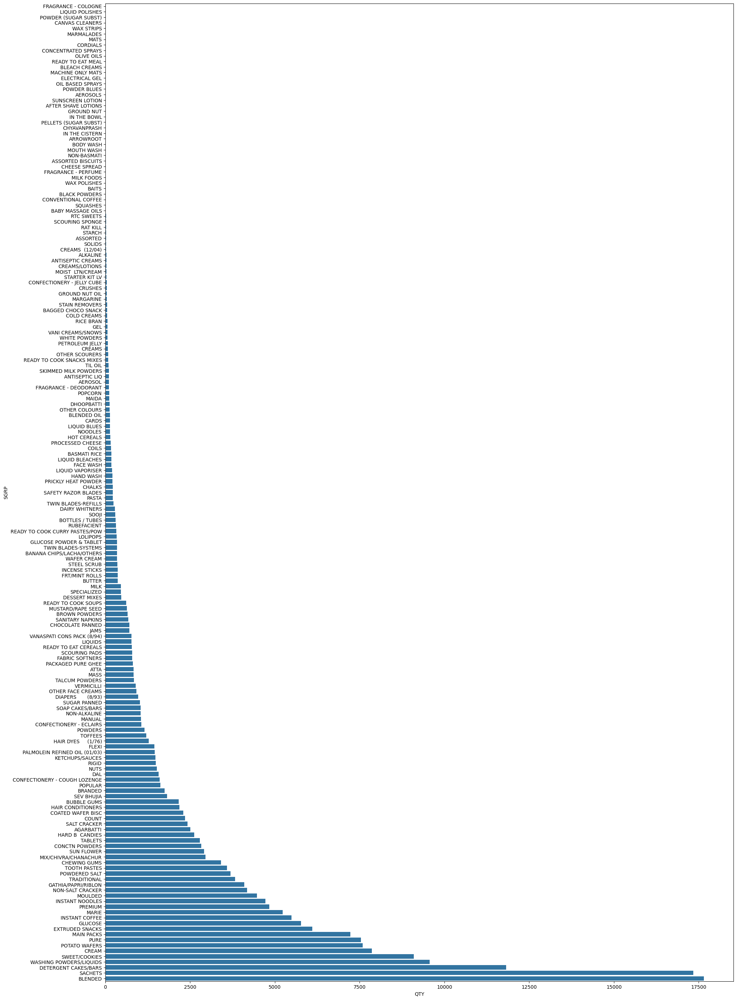

In [30]:
plt.figure(figsize=(23, 36))
a=df.groupby(['SGRP'],as_index=False)['QTY'].sum().sort_values(by='QTY',ascending=True)
sns.barplot(x='QTY',y='SGRP',data=a)

In [31]:
plt.figure(figsize=(50, 190))
# Create the plot
a = df.groupby(['BRD'], as_index=False)['QTY'].sum().sort_values(by='QTY', ascending=True)
sns.barplot(x='QTY', y='BRD', data=a)

<Axes: xlabel='QTY', ylabel='BRD'>

C:\Users\hp\AppData\Local\Temp\ipykernel_21100\981180982.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_df = df.pivot_table(index='MONTH', columns='GRP', values='QTY', aggfunc='sum')


Text(0.5, 1.0, 'Stacked Bar Plot of Quantity by Month and Product Group (GRP)')

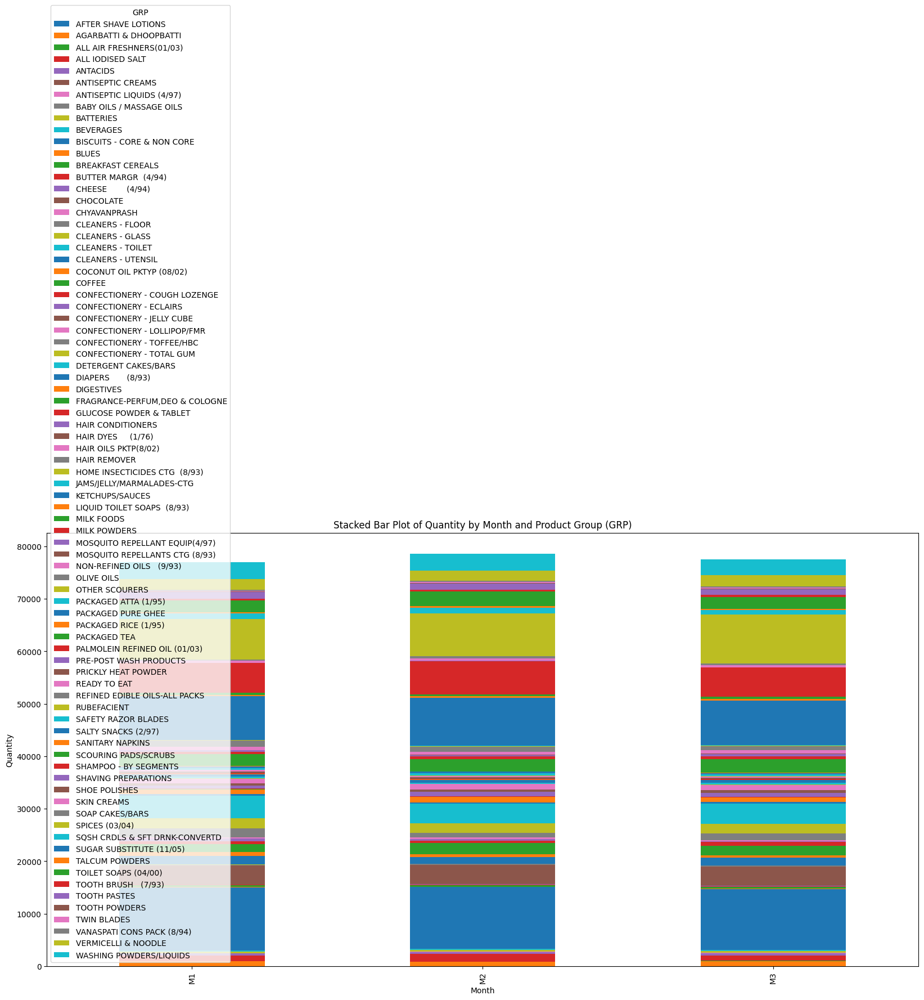

In [32]:
# Pivot the data
pivot_df = df.pivot_table(index='MONTH', columns='GRP', values='QTY', aggfunc='sum')

# Plot the stacked bar plot
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(20, 10))

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.title('Stacked Bar Plot of Quantity by Month and Product Group (GRP)')

In [33]:
# Pivot the data
pivot_df = df.pivot_table(index='MONTH', columns='BRD', values='QTY', aggfunc='sum')

# Plot the stacked bar plot
ax = pivot_df.plot(kind='bar', stacked=True, figsize=(20, 10), xticks=[])

# Add labels and title
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.title('Stacked Bar Plot of Quantity by Month and Product Brand (BRD)')

C:\Users\hp\AppData\Local\Temp\ipykernel_21100\2741356374.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_df = df.pivot_table(index='MONTH', columns='BRD', values='QTY', aggfunc='sum')


Text(0.5, 1.0, 'Stacked Bar Plot of Quantity by Month and Product Brand (BRD)')

(-1.099999976453862,
 1.0999999988778253,
 -1.0999999998353935,
 1.099999999992161)

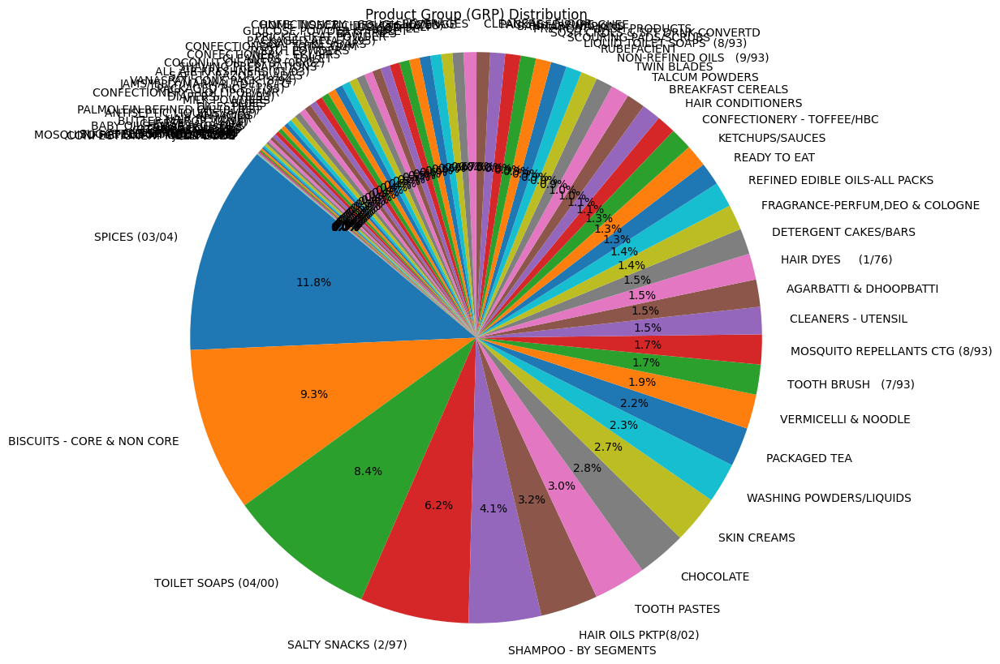

In [34]:
grp_counts = df['GRP'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(10, 10))
plt.pie(grp_counts, labels=grp_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Product Group (GRP) Distribution')
plt.axis('equal')

(-1.0999999999999999, 1.0999999999999999, -1.1, 1.1)

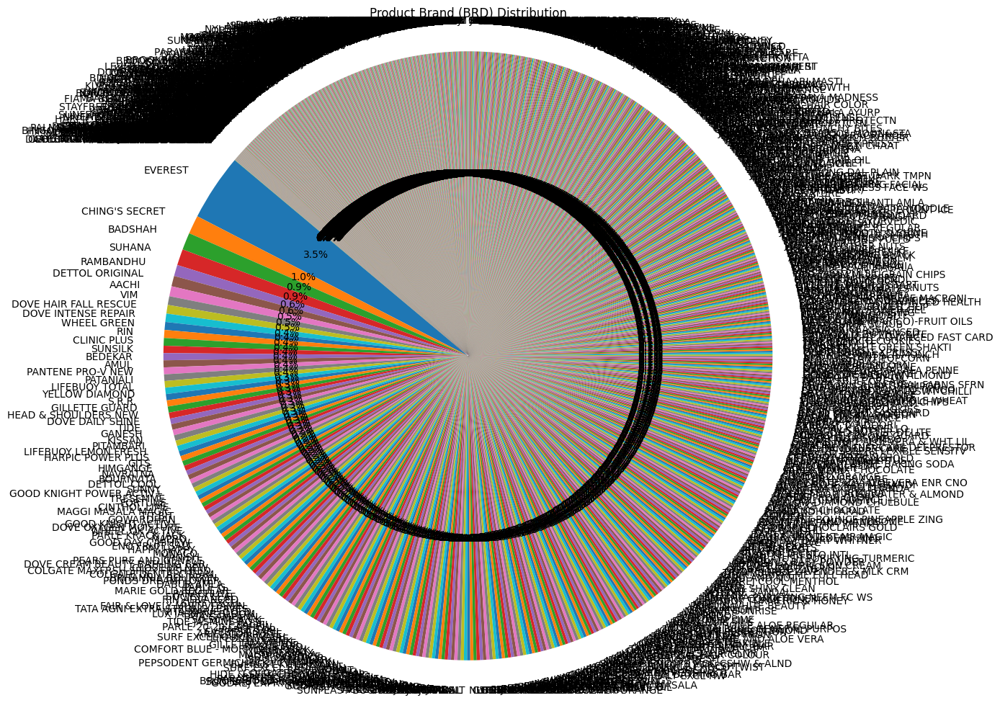

In [35]:
grp_counts = df['BRD'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(12, 12))
plt.pie(grp_counts, labels=grp_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Product Brand (BRD) Distribution')
plt.axis('equal')

In [ ]:
# Extract these columns for analysis
columns_of_interest = ['QTY', 'GRP', 'BRD', 'STORECODE']
data_subset = df[columns_of_interest]

# One-hot encode categorical variables
data_subset = pd.get_dummies(data_subset, columns=['GRP', 'BRD', 'STORECODE'])

# Calculate the correlation matrix
correlation_matrix = data_subset.corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')

In [ ]:
grp_counts = df['STORECODE'].value_counts()

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(grp_counts, labels=grp_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Store Code (STORECODE) Distribution')
plt.axis('equal')

In [ ]:
plt.figure(figsize=(35, 85))
a=df.groupby(['CMP'],as_index=False)['QTY'].sum().sort_values(by='QTY',ascending=True)
sns.barplot(x='QTY',y='CMP',data=a)

In [ ]:
brand_counts = df['BRD'].value_counts()
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(brand_counts)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
# Set up the plot
plt.figure(figsize=(30, 8))

# Create the violin plot
sns.violinplot(x='GRP', y='QTY', hue='BRD', data=df, inner='stick', palette='Set1')

# Customize the plot
plt.title('Violin Plot of Quantity by Product Group and Brand')
plt.xlabel('Product Group (GRP)')
plt.ylabel('Quantity')
plt.xticks(rotation=45)
plt.legend(title='Brand (BRD)', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.subplots_adjust(right=0.8)  # Increase the right margin to accommodate the legend

# Show the plot
plt.show()